In [1]:
import keras
import tensorflow as tf
import gdal
import os
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from keras_unet.models import custom_unet, satellite_unet
from keras_unet.metrics import iou, iou_thresholded
from keras_unet.losses import jaccard_distance
from keras_unet.utils import plot_segm_history

-----------------------------------------
keras-unet init: TF version is >= 2.0.0 - using `tf.keras` instead of `Keras`
-----------------------------------------


In [2]:
base_dir = Path(r'/media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2')
mask_dir = base_dir.joinpath('masks_img')
image_dir = Path(r'/media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/img')
water_dir = mask_dir.joinpath('water')
shrubs_dir = mask_dir.joinpath('shrub')
taiga_dir = mask_dir.joinpath('taiga')

In [3]:
test = gdal.Open(r'/media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/img/img_1.tif', gdal.GA_ReadOnly)

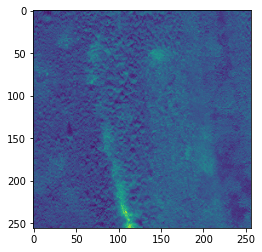

In [4]:
plt.imshow(test.GetRasterBand(1).ReadAsArray())

In [5]:
def make_path(img_dir, prefix, number):
    return os.path.join(img_dir, f"{prefix}_{number}.tif")

In [6]:
def img_number(fpath: str) -> int:
    return int(os.path.splitext(os.path.split(fpath)[1])[0].split('_')[-1])

In [7]:
import typing as t

def load_image_rgb(path: str, shape: t.Tuple[int,int,int], dtype) -> np.ndarray:
    image = np.zeros(shape = shape, dtype=dtype)
    ds= gdal.Open(path, gdal.GA_ReadOnly)
    for i in (1, 2, 3):
        image[:, :, i-1] = ds.GetRasterBand(i).ReadAsArray()
    return image



In [8]:
def load_image(path: str) -> np.ndarray:
    ds = gdal.Open(path, gdal.GA_ReadOnly)
    return ds.GetRasterBand(1).ReadAsArray()

In [9]:
def load_stack_rgb(shape, dtype, img_dir, prefix):
    stack = np.zeros(shape = shape, dtype = dtype)
    for i in range(shape[0]):
        image_path = make_path(img_dir, prefix, i + 1)
        # subsets for rgb bands only
        stack[i, :, :, :] = load_image_rgb(image_path, (shape[1], shape[2], shape[3]), dtype)
    return stack

# need to skip when there is no mask
# loads single band mask
def load_stack_safely(shape, dtype, img_dir, prefix):
    stack = np.zeros(shape = shape, dtype = dtype)
    for i in range(shape[0]):
        image_path = make_path(img_dir, prefix, i + 1)
        if not os.path.isfile(image_path):
            print("skipping", image_path)
            continue
        stack[i, :, :] = load_image(image_path)
    return stack

In [10]:
# training total data size
I = 245
# image dim 1
N = 256
# image dim 2
M = 256
# number of image bands
L = 3
# number of classes
V = 3

In [11]:
train_images = load_stack_rgb((I, N, M, L), np.int8, image_dir, "img")
train_images_R = train_images.reshape(I, N, M, L)

In [12]:
train_images_R.shape

(245, 256, 256, 3)

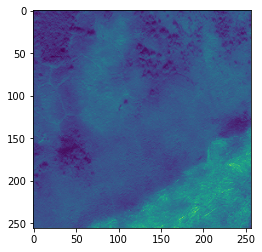

In [13]:
plt.imshow(train_images[1, :,:,1])

In [14]:
water_mask = load_stack_safely((I, N, M), np.int8, water_dir, "water")
taiga_mask = load_stack_safely((I, N, M), np.int8, taiga_dir, "taiga")
shrubs_mask = load_stack_safely((I, N, M), np.int8, shrubs_dir, "shrub")

skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/water/water_1.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/water/water_2.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/water/water_3.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/water/water_4.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/water/water_6.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/water/water_9.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/water/water_11.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/water/water_16.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/water/water_17.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks

skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/taiga/taiga_113.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/taiga/taiga_114.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/taiga/taiga_115.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/taiga/taiga_117.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/taiga/taiga_118.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/taiga/taiga_119.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/taiga/taiga_120.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/taiga/taiga_121.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/taiga/taiga_122.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u

skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/shrub/shrub_163.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/shrub/shrub_165.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/shrub/shrub_166.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/shrub/shrub_171.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/shrub/shrub_172.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/shrub/shrub_174.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/shrub/shrub_175.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/shrub/shrub_176.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/masks_img/shrub/shrub_179.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u

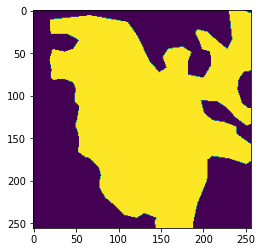

In [15]:
plt.imshow(taiga_mask[12, :,:])

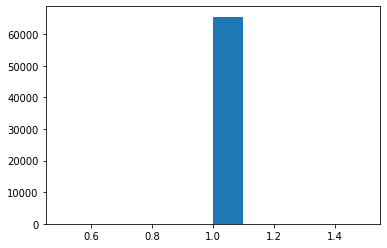

In [16]:
plt.hist(water_mask[4, :,:].flatten())
plt.show()

In [17]:
taiga_mask.shape

(245, 256, 256)

In [25]:
# Hold images 100-125 for testing overfitting

W = 220
Y = np.zeros(shape=(W, N, M, V), dtype =np.int8)
Y_train_img = np.zeros(shape=(W, N, M, L), dtype =np.float32)

Y[0:100, :, :, 0] = taiga_mask[0:100, :, :]
Y[0:100, :, :, 1] = water_mask[0:100, :, :]
Y[0:100, :, :, 2] = shrubs_mask[0:100, :, :]
Y_train_img[0:100, :, :, :] = train_images_R[0:100, :, :, :]

Y[100:220, :, :, 0] = taiga_mask[125:245, :, :]
Y[100:220, :, :, 1] = water_mask[125:245, :, :]
Y[100:220, :, :, 2] = shrubs_mask[125:245, :, :]
Y_train_img[100:220, :, :, :] = train_images_R[125:245, :, :, :]




In [26]:
K = 25
Y_valid = np.zeros(shape=(K, N, M, V), dtype =np.int8)
Y_valid_img = np.zeros(shape=(K, N, M, L), dtype =np.float32)

Y_valid[0:25, :, :, 0] = taiga_mask[100:125, :, :]
Y_valid[0:25, :, :, 1] = water_mask[100:125, :, :]
Y_valid[0:25, :, :, 2] = shrubs_mask[100:125, :, :]
Y_valid_img[0:25, :, :, :] = train_images_R[100:125, :, :, :]

In [27]:
Y.shape

(220, 256, 256, 3)

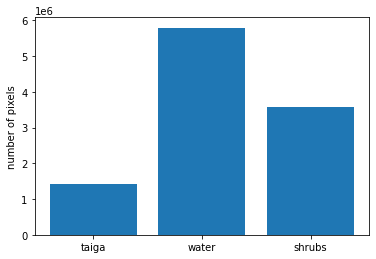

In [28]:
fig, ax = plt.subplots()
ax.bar(range(V), [taiga_mask.sum(), water_mask.sum(), shrubs_mask.sum()])
ax.set_xticks((0, 1, 2))
ax.set_xticklabels(('taiga', 'water', 'shrubs',))
plt.ylabel('number of pixels')
plt.show()

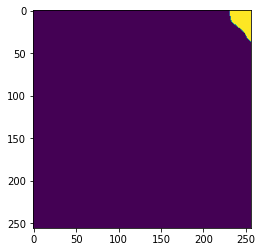

In [29]:
plt.imshow(Y[199,:,:,2])

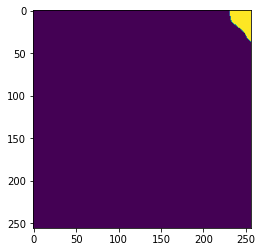

In [30]:
plt.imshow(shrubs_mask[224,:, :])

In [31]:
Y_train_img[50,:,:,2]

array([[20., 19., 20., ..., 24., 25., 24.],
       [18., 19., 20., ..., 24., 23., 24.],
       [20., 20., 19., ..., 24., 24., 24.],
       ...,
       [21., 21., 22., ..., 23., 24., 22.],
       [23., 21., 21., ..., 23., 22., 26.],
       [20., 23., 21., ..., 24., 24., 25.]], dtype=float32)

In [32]:
model = satellite_unet((N, M, 3), 3)

In [33]:
model.compile(
    optimizer = tf.keras.optimizers.Adam(),
    loss = "binary_crossentropy",
    metrics = [iou, iou_thresholded],
)

In [34]:
history = model.fit(Y_train_img, Y, epochs = 50)

Epoch 1/50
7/7 [==============================] - 35s 4s/step - loss: 0.5488 - iou: 0.3789 - iou_thresholded: 0.4596
Epoch 2/50
7/7 [==============================] - 28s 4s/step - loss: 0.2251 - iou: 0.5534 - iou_thresholded: 0.6515
Epoch 3/50
7/7 [==============================] - 28s 4s/step - loss: 0.2136 - iou: 0.5964 - iou_thresholded: 0.6818
Epoch 4/50
7/7 [==============================] - 28s 4s/step - loss: 0.1717 - iou: 0.6371 - iou_thresholded: 0.7326
Epoch 5/50
7/7 [==============================] - 28s 4s/step - loss: 0.1559 - iou: 0.6657 - iou_thresholded: 0.7624
Epoch 6/50
7/7 [==============================] - 28s 4s/step - loss: 0.1598 - iou: 0.6706 - iou_thresholded: 0.7607
Epoch 7/50
7/7 [==============================] - 29s 4s/step - loss: 0.1302 - iou: 0.7197 - iou_thresholded: 0.8051
Epoch 8/50
7/7 [==============================] - 28s 4s/step - loss: 0.1329 - iou: 0.7133 - iou_thresholded: 0.7973
Epoch 9/50
7/7 [==============================] - 28s 4s/step - 

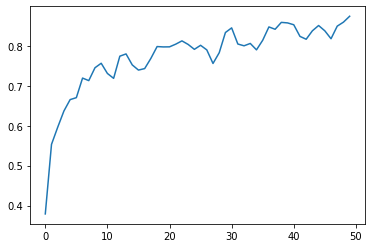

In [35]:
plt.plot(history.history['iou'])

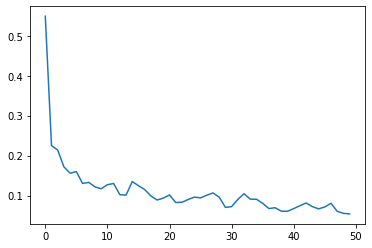

In [36]:
plt.plot(history.history['loss'])

In [37]:
modelsave_path = Path(r'/media/hkropp/research/Kolyma_Data/training/v2/model/2020_strat')

In [83]:
model.save(modelsave_path)

In [38]:
Y_pred = model.predict(Y_train_img)

7/7 [==============================] - 11s 2s/step


In [39]:
Y_pred.shape

(220, 256, 256, 3)

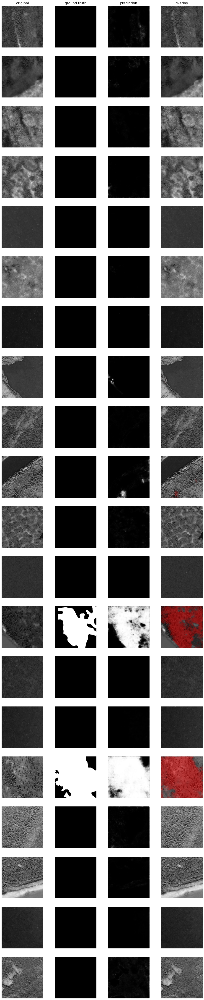

In [41]:
from keras_unet.utils import plot_imgs

# trees
plot_imgs(
    org_imgs=Y_train_img.reshape(220, N, M, 3)[:,:,:,0], 
    mask_imgs=Y[:, :, :, 0], 
    pred_imgs=Y_pred[:, :, :, 0], 
    nm_img_to_plot=20
  )

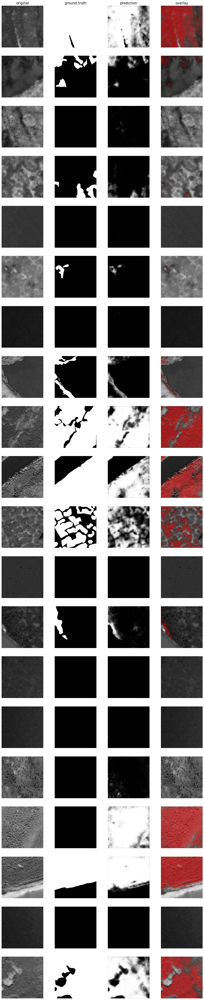

In [42]:
# Shrubs
plot_imgs(
    org_imgs=Y_train_img.reshape(220, N, M, 3)[:,:,:,0], 
    mask_imgs=Y[:, :, :, 2], 
    pred_imgs=Y_pred[:, :, :, 2], 
    nm_img_to_plot=20
  )

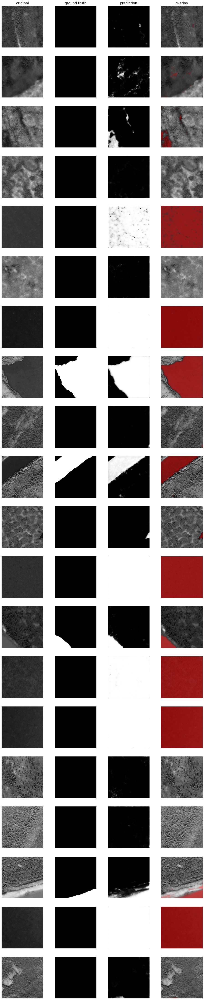

In [43]:
# water
plot_imgs(
    org_imgs=Y_train_img.reshape(220, N, M, 3)[:,:,:,0], 
    mask_imgs=Y[:, :, :, 1], 
    pred_imgs=Y_pred[:, :, :, 1], 
    nm_img_to_plot=20
  )

In [44]:
valid_pred = model.predict(Y_valid_img)

1/1 [==============================] - 1s 1s/step


In [45]:
valid_pred[1,:, :, 0]

array([[0.0811137 , 0.03890508, 0.0142018 , ..., 0.02632671, 0.04306293,
        0.10644299],
       [0.03317796, 0.00810059, 0.01068373, ..., 0.00693475, 0.01306823,
        0.07940774],
       [0.03485396, 0.02242946, 0.00986113, ..., 0.02046158, 0.03672909,
        0.0525082 ],
       ...,
       [0.05781553, 0.0231559 , 0.00556978, ..., 0.03852805, 0.01988267,
        0.07211658],
       [0.12537983, 0.05750861, 0.0093669 , ..., 0.05503747, 0.14576921,
        0.364409  ],
       [0.07772522, 0.11261154, 0.03304505, ..., 0.34619823, 0.24545188,
        0.46270603]], dtype=float32)

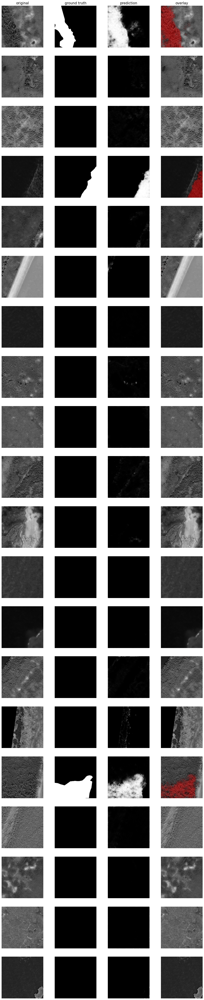

In [46]:
# Trees
plot_imgs(
    org_imgs=Y_valid_img.reshape(25, N, M, 3)[:,:,:,0], 
    mask_imgs=Y_valid[:, :, :, 0], 
    pred_imgs=valid_pred[:, :, :, 0], 
    nm_img_to_plot=20
  )

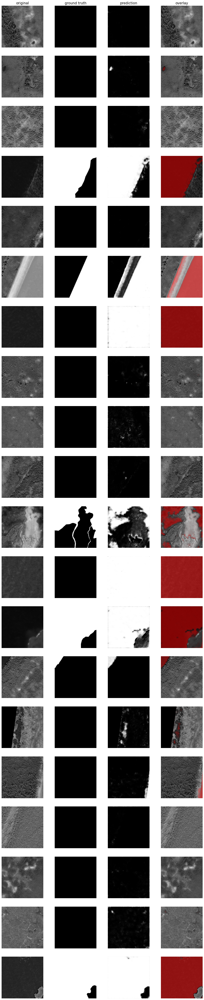

In [47]:
# Water
plot_imgs(
    org_imgs=Y_valid_img.reshape(25, N, M, 3)[:,:,:,0], 
    mask_imgs=Y_valid[:, :, :, 1], 
    pred_imgs=valid_pred[:, :, :, 1], 
    nm_img_to_plot=20
  )

In [48]:
waterPredict = valid_pred[:,:,:,1]

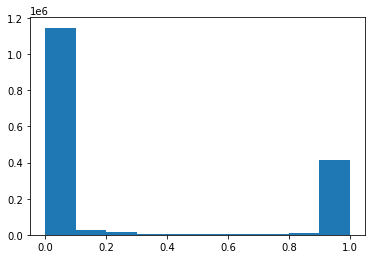

In [49]:
plt.hist(waterPredict.flatten())
plt.show()

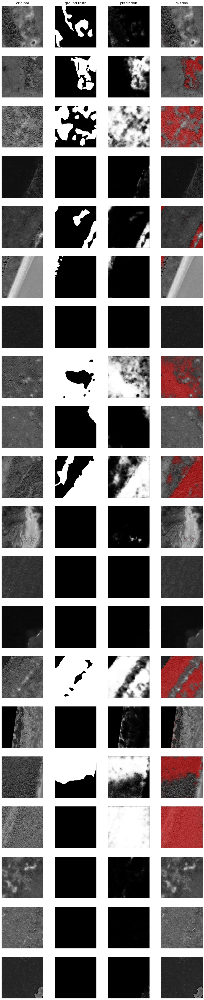

In [50]:
# Shrubs
plot_imgs(
    org_imgs=Y_valid_img.reshape(25, N, M, 3)[:,:,:,0], 
    mask_imgs=Y_valid[:, :, :, 2], 
    pred_imgs=valid_pred[:, :, :, 2], 
    nm_img_to_plot=20
  )

In [51]:
Y_valid[0,0,0,0]

1

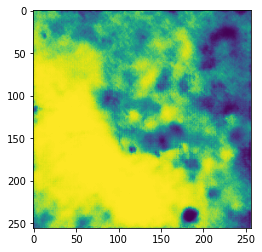

In [52]:
plt.imshow(valid_pred[7,:, :,2])

In [53]:
driver = gdal.GetDriverByName("GTiff")

In [54]:
driver.Register()

2

In [55]:
image_dir

PosixPath('/media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_20v2/img')

In [56]:
base_dirP = Path(r'/media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256')

In [57]:
tiles = os.listdir(base_dirP)

In [58]:
T = len(tiles)

In [59]:
predict_img = load_stack_rgb((T, N, M, 3), np.int8,base_dirP, "img")

In [60]:
predict_img.shape

(12144, 256, 256, 3)

In [61]:
Y_all = model.predict(predict_img.reshape(T, N, M, 3))

380/380 [==============================] - 589s 2s/step


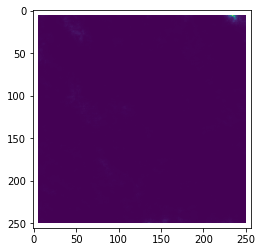

In [62]:
# change edges to missing data
Y_trim = Y_all
Y_trim[:,0:5,:,:] = np.nan
Y_trim[:,:,0:5,:] = np.nan
Y_trim[:,251:256,:,:] = np.nan
Y_trim[:,:,251:256,:] = np.nan
plt.imshow(Y_trim[1000,:,:,2])

In [63]:
def save_predict_tree( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path(base_dirP, prefix_orig, i+1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_trim[i, :, :, 0])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [64]:
tree_pred_dir = r'/media/hkropp/research/Kolyma_Data/predictions/v2/2020_strat_1/taiga'
save_predict_tree(nImg = T,xdim= 256, ydim= 256,img_dir = tree_pred_dir,prefix = "taiga_predict",orig_dir = base_dirP , prefix_orig = "img")

In [65]:
def save_predict_water( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path(base_dirP, prefix_orig, i+1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_trim[i, :, :, 1])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [66]:
water_pred_dir = r'/media/hkropp/research/Kolyma_Data/predictions/v2/2020_strat_1/water'
save_predict_water(nImg = T,xdim= 256, ydim= 256,img_dir = water_pred_dir,prefix = "water_predict",orig_dir = base_dirP , prefix_orig = "img")

In [67]:
def save_predict_shrub( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path(base_dirP, prefix_orig, i+1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_trim[i, :, :, 2])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [68]:
shrub_pred_dir = r'/media/hkropp/research/Kolyma_Data/predictions/v2/2020_strat_1/shrub'
save_predict_shrub(nImg = T,xdim= 256, ydim= 256,img_dir = shrub_pred_dir,prefix = "shrub_predict",orig_dir = base_dirP , prefix_orig = "img")

In [69]:
# check for partial tiles
imgD1 = np.zeros((T,2), dtype=int)



test = load_image(r'/media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_11.tif')

In [70]:
base_dirP2 = Path(r'/media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2')

tiles2 = os.listdir(base_dirP2)

T2 = len(tiles2)
imgD1 = np.zeros((T2,2), dtype=int)

In [71]:
T

12144

In [72]:
for i in range(T2):
    tileLoad = load_image(make_path(base_dirP2, "img", i + 1))
    imgD1[i,0] = tileLoad.shape[0]
    imgD1[i,1] = tileLoad.shape[1]

In [73]:
imgFlag = np.zeros((T2), dtype=int)

for i in range(T2):
    if imgD1[i,0] < 256 or imgD1[i,1] < 256:
        imgFlag[i] = 1
    else:
        imgFlag[i] = 0

In [74]:
imgTable = np.zeros((T2,2), dtype=int)
for i in range(T2):
    imgTable[i,0] = imgFlag[i]
    imgTable[i,1] = i+1

In [75]:
imgTable

array([[    0,     1],
       [    0,     2],
       [    0,     3],
       ...,
       [    1, 12274],
       [    1, 12275],
       [    1, 12276]])

In [76]:
def load_stack_tiles(shape, dtype, img_dir, prefix, imgFlag):
    stack = np.zeros(shape = shape, dtype = dtype)
    for i in range(shape[0]):
        tilepath = make_path(img_dir, prefix, i + 1)
        if imgFlag[i,0] == 1:
            print("nullified", tilepath)
            stack[i,:,:,:] = np.zeros(shape = (shape[1], shape[2], shape[3]), dtype = dtype)
        else:
            stack[i, :,:,:] = load_image_rgb(tilepath, (shape[1], shape[2], shape[3]), dtype)
    return stack

In [77]:


predict_img2 = load_stack_tiles((T2, N, M, 3), np.int8, base_dirP2, "img", imgTable)

predict_img2.shape

nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_93.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_186.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_279.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_372.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_465.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_558.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_651.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_744.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_837.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_930.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_1023.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_

nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_9114.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_9207.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_9300.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_9393.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_9486.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_9579.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_9672.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_9765.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_9858.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_9951.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_2/img_10044.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tile

(12276, 256, 256, 3)

In [78]:
Y_all2 = model.predict(predict_img2.reshape(T2, N, M, 3))

384/384 [==============================] - 593s 2s/step


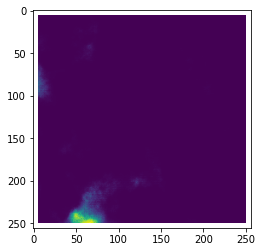

In [79]:
# change edges to missing data
Y_trim2 = Y_all2
Y_trim2[:,0:5,:,:] = np.nan
Y_trim2[:,:,0:5,:] = np.nan
Y_trim2[:,251:256,:,:] = np.nan
Y_trim2[:,:,251:256,:] = np.nan
plt.imshow(Y_trim2[1000,:,:,2])

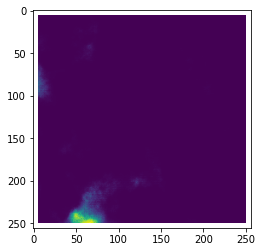

In [80]:
plt.imshow(Y_trim2[1000,:,:,2])

In [81]:
Y_all2.shape

(12276, 256, 256, 3)

In [82]:
def save_predict_tree2( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path(orig_dir, prefix_orig, i+1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_trim2[i, :, :, 0])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [83]:
tree_pred_dir = r'/media/hkropp/research/Kolyma_Data/predictions/v2/2020_strat_2/taiga'
save_predict_tree2(nImg = T,xdim= 256, ydim= 256,img_dir = tree_pred_dir,prefix = "taiga_predict",orig_dir = base_dirP2 , prefix_orig = "img") 

In [84]:
def save_predict_water2( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path(orig_dir, prefix_orig, i+1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_trim2[i, :, :, 1])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [85]:
water_pred_dir = r'/media/hkropp/research/Kolyma_Data/predictions/v2/2020_strat_2/water'
save_predict_water2(nImg = T,xdim= 256, ydim= 256,img_dir = water_pred_dir,prefix = "water_predict",orig_dir = base_dirP2 , prefix_orig = "img")

In [86]:
def save_predict_shrub2( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path(orig_dir, prefix_orig, i+1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_trim2[i, :, :, 2])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [87]:
shrub_pred_dir = r'/media/hkropp/research/Kolyma_Data/predictions/v2/2020_strat_2/shrub'
save_predict_shrub2(nImg = T,xdim= 256, ydim= 256,img_dir = shrub_pred_dir,prefix = "shrub_predict",orig_dir = base_dirP2 , prefix_orig = "img")

In [88]:
# check for partial tiles
imgD1 = np.zeros((T,2), dtype=int)




test = load_image(r'/media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_11.tif')

In [89]:
base_dirP3 = Path(r'/media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3')

tiles = os.listdir(base_dirP3)

T = len(tiles)
imgD1 = np.zeros((T2,2), dtype=int)

In [90]:
for i in range(T):
    tileLoad = load_image(make_path(base_dirP3, "img", i + 1))
    imgD1[i,0] = tileLoad.shape[0]
    imgD1[i,1] = tileLoad.shape[1]

In [91]:
imgFlag = np.zeros((T), dtype=int)

for i in range(T):
    if imgD1[i,0] < 256 or imgD1[i,1] < 256:
        imgFlag[i] = 1
    else:
        imgFlag[i] = 0

In [92]:
imgTable = np.zeros((T,2), dtype=int)
for i in range(T):
    imgTable[i,0] = imgFlag[i]
    imgTable[i,1] = i+1

In [93]:
def load_stack_tiles(shape, dtype, img_dir, prefix, imgFlag):
    stack = np.zeros(shape = shape, dtype = dtype)
    for i in range(shape[0]):
        tilepath = make_path(img_dir, prefix, i + 1)
        if imgFlag[i,0] == 1:
            print("nullified", tilepath)
            stack[i,:,:,:] = np.zeros(shape = (shape[1], shape[2], shape[3]), dtype = dtype)
        else:
            stack[i, :,:,:] = load_image_rgb(tilepath, (shape[1], shape[2], shape[3]), dtype)
    return stack

In [94]:


predict_img3 = load_stack_tiles((T, N, M, 3), np.int8, base_dirP3, "img", imgTable)

predict_img3.shape

nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_92.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_184.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_276.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_368.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_460.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_552.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_644.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_736.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_828.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_920.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_1012.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_

nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_9108.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_9200.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_9292.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_9384.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_9476.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_9568.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_9660.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_9752.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_9844.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_9936.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tiles_256_3/img_10028.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/2020/tile

(12144, 256, 256, 3)

In [95]:
Y_all3 = model.predict(predict_img3.reshape(T, N, M, 3))

380/380 [==============================] - 602s 2s/step


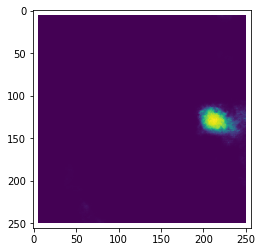

In [96]:
# change edges to missing data
Y_trim3 = Y_all3
Y_trim3[:,0:5,:,:] = np.nan
Y_trim3[:,:,0:5,:] = np.nan
Y_trim3[:,251:256,:,:] = np.nan
Y_trim3[:,:,251:256,:] = np.nan
plt.imshow(Y_trim3[1000,:,:,2])

In [97]:
def save_predict_tree3( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path(orig_dir, prefix_orig, i+1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_trim3[i, :, :, 0])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [98]:
tree_pred_dir = r'/media/hkropp/research/Kolyma_Data/predictions/v2/2020_strat_3/taiga'
save_predict_tree3(nImg = T,xdim= 256, ydim= 256,img_dir = tree_pred_dir,prefix = "taiga_predict",orig_dir = base_dirP3 , prefix_orig = "img") 

In [99]:
def save_predict_water3( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path(orig_dir, prefix_orig, i+1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_trim3[i, :, :, 1])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [100]:
water_pred_dir = r'/media/hkropp/research/Kolyma_Data/predictions/v2/2020_strat_3/water'
save_predict_water3(nImg = T,xdim= 256, ydim= 256,img_dir = water_pred_dir,prefix = "water_predict",orig_dir = base_dirP3 , prefix_orig = "img")

In [101]:
def save_predict_shrub3( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path(orig_dir, prefix_orig, i+1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_trim3[i, :, :, 2])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [102]:
shrub_pred_dir = r'/media/hkropp/research/Kolyma_Data/predictions/v2/2020_strat_3/shrub'
save_predict_shrub3(nImg = T,xdim= 256, ydim= 256,img_dir = shrub_pred_dir,prefix = "shrub_predict",orig_dir = base_dirP3 , prefix_orig = "img")